<a href="https://colab.research.google.com/github/DavideEva/Ghibli-Cartoon-GAN/blob/main/Cartoon_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Authors
The authors of this code, this notebook and its documentation are Luca Deluigi and Davide Evangelisti.

This is a university project for the Deep Learning class of academic year 2020/2021, at Alma Mater Studiorum - University of Bologna, Department of Computer Science and Engineering (DISI), with professor Matteo Ferrara.


# Problem analysis

The purpose of this notebook is to showcase a method to convert photos into cartoons.  
More specifically, cartoons drawn in the style of Studio Ghibli's anime.

This problem belongs to the *style-transfer* category, and the usual way to solve this kind of task is by implementing a Deep Convolutional Generative Adversarial Networks (DC-GANs).

The inspiration and architecture for our solution is based on [this paper](https://arxiv.org/abs/2005.07702) and [its code](https://github.com/FilipAndersson245/cartoon-gan).

All the code absent from this notebook (in particular the preprocessing algorythms) can be found at [this GitHub repository](https://github.com/DavideEva/Ghibli-Cartoon-GAN).

We planned to train a Discriminator (D) net capable of classifying images into a matrix of labels, that determine whether their corresponding region in the subject image is a real anime in Studio Ghibli's style or not. Its adversary is a Generator (G) net capable of generating Studio Ghibli's stylized anime images from images of real photos without losing the original content's features.

Our most important contributions to the original work are:
- Overcoming the 'feature anomalies' problem with dataset filtering (see the orignal paper for reference)
- Better analysis of the training progress and outputs
- Implementation of the [FID metric](https://en.wikipedia.org/wiki/Fr%C3%A9chet_inception_distance) evaluation
- Experimenting with different iperparameters, finding new good values
- Implementation of the whole architecture with tensorflow, instead of pytorch


# The Data

The datasets we gathered consists of Flickr30k images and a collection of famous Studio Ghibli's movies' frames. Both these datasets were analyzed, filtered and preprocessed.

**Warning:** *given that Studio Ghibli's movies are under copyright restrictment, you should not share the data used by this notebook anywhere else.*

## Dataset analysis

### Flickr30k Analysis
The Flickr30k dataset consists of about 31.000 images taken from the Flickr website. Its usage is free from any copyright restriction. The images can be divided into two main categories:
- Portrait images (that have height > width)
- Landscape images.

### Ghibli Movies Analysis
The Ghibli movies dataset is a collection of every frame of some of the most famous Studio Ghibli's movies.
The movies are:
- From.Up.on.Poppy.Hill
- Grave.of.the.Fireflies
- Howl's.Moving.Castle
- Kiki's.Delivery.Service
- Laputa.Castle.In.The.Sky
- My.Neighbor.Totoro
- Ocean.Waves
- Only.Yesterday
- Porco.Rosso
- Princess Mononoke
- The.Borrower.Arrietty
- The.Wind.Rises
- When.Marnie.Was.There
- Whisper.of.the.Heart

We selected the movies based on their drawing style, which must be somehow consistent between the movies.  
Most of the frames is just a slightly variated version of the previous or folloring one. This means, as it's told in the reference paper, that frames must be filtered based on the scene.

### Known dataset problems
Based on the feedback that the original authors of the paper gave about their own dataset (which is very similar to ours) we gathered some problems and concerns to handle. Firstly, the datasets contains a lot of recurring features that end up in the generated images in the wrong context. The most prominent ones are *eyes*, *hair* and color blobs. Secondly, generated images often presented different colors for adjacent regions of space that should have the same color, just because a line divides them. In our work, we addressed the recurring features problem, as explained in the dataset filtering section.

## Dataset Filtering

### Flickr30k Filtering
The Flickr30k dataset was filtered by removing every portrait image because those image didn't work properly with the preprocessing algorythm. The details are explained in the relative paragraph.

### Ghibli Movies Filtering
Movies frames were filtered based on three algorythms:
1. 10 frames per scene taken with [PySceneDetect](https://pyscenedetect.readthedocs.io/en/latest/) (as opposed to 3 in the reference paper). A *scene* is a sequence of frames which are similar enough to hypothesize that no camera cuts were made in-between them. Taking only 10 images from a scene means that we are discarding lots of similar frames that don't contribute to the dataset in a meaningful way.
2.  Manual scene selection done by a user (us) based on a common rule: **discarding most of the frames that contain a face in the foreground**. This took many hours but eventually we achieved a pretty good result. The purpose of this filtering was to avoid the appearance of recurring features like eyes and hair in the wrong contextes (such as on a landscape).
3. Discarding subsequent images that were too similar, measured in the following way (the code can be found [here](https://github.com/DavideEva/Ghibli-Cartoon-GAN/blob/1dcd56b96599091197c2a9e3d4423b39256d472b/frames_selector.py#L74)):
```python
def compare_images(image1, image2):
    hash = cv2.img_hash.AverageHash_create()
    cutoff = 8
    return hash.compare(hash.compute(image1), hash.compute(image2)) < cutoff
```
This computes the Hamming distance of the hash of the input images and checks if at least 8 of the 64 hashed regions are different. If it's not that case, the last image is discarded.

## Dataset Preprocessing
We implemented three kind of preprocessing:
- *real* image preprocessing:
  1. Image resize to have height equal to 256 pixels, mantaining the original proportions.
  2. Image cropping of a left square of 256x256 pixels and a right square of 256x256 pixels taken from the left and right edges respectively. This means that for an image of less than a 2:1 ratio the two squares overlap. This creates two images, a *left* version and a *right* version of the original. Note that this step can't work for portrait images, this is why we removed them from Flickr30k.
- *smooth*  image preprocessing:
  1. Image resize, same as the real preprocessing.
  1. Edge blurring/smoothing:
    1. Image conversion to grayscale
    1. [Canny edge detection](https://en.wikipedia.org/wiki/Canny_edge_detector) with 150 abd 500 as threshold (slightly different from the paper)
    1. 5x5 kernel dilation of the edge mask created in step 2
    1. Gaussian blur with a 5x5 kernel and 3 pixels of padding only applied on the pixels of the mask created in step 3
  1. Image cropping, same as the real preprocessing. This creates a *smoothed+left* and a *smoothed+right* version of the original image.
- *mask* image preprocessing:
  1. Image resize, same as the previous preprocessings
  1. Edge detection:
    1. Image conversion to grayscale, same as the *smooth* preprocessing
    1. Canny edge detection, same as the *smooth* preprocessing
    1. Mask dilation, same as the *smooth* preprocessing

The purpose of each step will be explained further.

### Flickr30k Preprocessing

The Flickr30k dataset of landscape image underwent the *real* image preprocessing.

### Ghibli Movies Preprocessing

Each Ghibli movie frame underwent each of the three preprocessing method, separately. This sextuples the dataset image count, because for each image we now have a real-left, real-right, smoothed-left, smoothed-right, mask-left and mask-right version. Nevertheless, the whole dataset has been filtered well enough to stay under 3GB zipped.

# Download datasets

We provide preprocessed data on Google Drive. This code downloads it and unzips the files. It takes several minutes to complete.

In [1]:
from glob import glob
! rm -rf sample_data

In [2]:
flickr30k_folder = 'Flickr30k-images-preprocessed'
! mkdir "$flickr30k_folder" && \
gdown --id "10c0Xruu2wAE-FpQEIlXm17HlwQAJKKVM" && \
unzip -qo flickr30k-images-preprocessed.zip -d "$flickr30k_folder" && \
rm flickr30k-images-preprocessed.zip

Downloading...
From: https://drive.google.com/uc?id=10c0Xruu2wAE-FpQEIlXm17HlwQAJKKVM
To: /content/flickr30k-images-preprocessed.zip
100% 1.45G/1.45G [00:26<00:00, 55.0MB/s]


In [3]:
# Unfiltered dataset: 1yYk3ZyxXdP2KHjE31fSTFGCNYb2QbSHe
# Filtered dataset: 1bR_BE-ZZSXW1URBJqPIMFo9VLODYb4_k

films_data = {
    "Ghibli": "1bR_BE-ZZSXW1URBJqPIMFo9VLODYb4_k"
}
ghibli_index = 0
real_folder = 'real'
smooth_folder = 'smooth'
mask_folder = 'mask'

def load_data(id, name):
  ! [ ! -d "$name" ] && mkdir -p "$name" && cd "$name" && gdown --id "$id"
  zip_files = glob(f'{name}/*.zip')
  for zip_file in zip_files:
    #! zip -FF "$zip_file" -O "temp.zip"
    #! unzip -qo "temp.zip" -d "$name"  # add to fix broken zip TODO remove
    ! unzip -qo "$zip_file" -d "$name"
    ! rm "$zip_file"
    # ! rm "temp.zip" # add to fix broken zip TODO remove
  return name

folders = [load_data(id_drive, studio_name) for studio_name, id_drive in films_data.items()]
print(folders)

Downloading...
From: https://drive.google.com/uc?id=1bR_BE-ZZSXW1URBJqPIMFo9VLODYb4_k
To: /content/Ghibli/preprocessed_filtered.zip
100% 2.57G/2.57G [00:55<00:00, 46.1MB/s]
['Ghibli']


Folder structure:
```bash
.
├── Studio_Name
|   ├── real
|   |   └── Movie_Name_1
|   |       ├── Scene-1.0.left.jpg
|   |       ├── Scene-1.0.right.jpg
|   |       ...
|   |       └──
|   |   
|   └── smooth
|       └── Movie_Name_2
|           ├── Scene-1.0.left.jpg
|           ├── Scene-1.0.right.jpg
|           ...
|           └──
├── Studio_Name_2
...
└──
```

## General purpose, pre-trained models

Arbitrary style transfer models like [*magenta/arbitrary-image-stylization-v1-256*](https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2) don't work well with this kind of task because the style of the drawings differ based on the subject drawn (characters, sky, sea, trees, mechanical parts).

Here's a little demonstration:

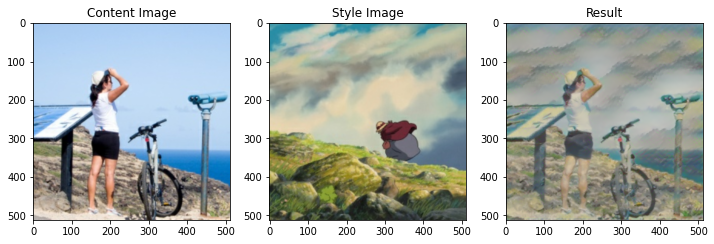

In [4]:
def show_magenta_arbitrary_image_stylization_results():

  import os
  import tensorflow as tf
  # Load compressed models from tensorflow_hub
  os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'
  import IPython.display as display

  import matplotlib.pyplot as plt
  import matplotlib as mpl
  mpl.rcParams['figure.figsize'] = (12, 12)
  mpl.rcParams['axes.grid'] = False

  import numpy as np
  import time
  import functools
  def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
      assert tensor.shape[0] == 1
      tensor = tensor[0]
    return tensor
  content_path = 'Flickr30k-images-preprocessed/flickr30k-images-out/real/left/328887787.jpg'
  style_path = 'Ghibli/real/Howl\'s.Moving.Castle.2004.BluRay.1080p.x265.10bit.4Audio.MNHD-FRDS/Scene-0189.Frame-001.right.jpg'
  def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img
  def imshow(image, title=None):
    if len(image.shape) > 3:
      image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
      plt.title(title)
  content_image = load_img(content_path)
  style_image = load_img(style_path)

  plt.subplot(1, 3, 1)
  imshow(content_image, 'Content Image')

  plt.subplot(1, 3, 2)
  imshow(style_image, 'Style Image')

  import tensorflow_hub as hub
  hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
  stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
  plt.subplot(1, 3, 3)
  imshow(tensor_to_image(stylized_image), 'Result')
show_magenta_arbitrary_image_stylization_results()

As you can see the result in the picture above, a general purpose style-transfer net heavily depends on the cartoon's content (like rocks and clouds) to recreate the style. This doesn't quite fit the Studio Ghibli style.

In the next chapters, we build the software infrastructure needed to train a discriminator and a generator with Tensorflow like the reference papers authors did with PyTorch. We found that the results achieved by that architecture overcome the alternatives, as the very same paper underlines.

# Imports

In [5]:
import numpy as np
import pandas as pd
import math
import random
import psutil
import pickle
import shutil
import os
import csv
import urllib
import re
from os import path
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
%matplotlib inline
from PIL import Image
from IPython.display import Image as ImageGif
import tensorflow as tf
from tensorflow.keras.layers import Layer, InputSpec, LeakyReLU, Input, Conv2D, Activation, Concatenate, Conv2DTranspose, BatchNormalization, AveragePooling2D, Add
from tensorflow import pad
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.utils import plot_model
from tensorflow.keras import Sequential
from tensorflow.keras.initializers import Constant
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3
from numpy import cov, trace, iscomplexobj
from scipy.linalg import sqrtm


! pip install tensorflow-addons
import tensorflow_addons as tfa
from tensorflow_addons.optimizers import CyclicalLearningRate

     |████████████████████████████████| 1.1 MB 5.4 MB/s 


# Utility functions


In [6]:
def plot_grid(images, columns, show_axis=False, labels=None):
  if len(images) == 0 or columns <= 0:
    return
  scale = 1.5
  height = (1 + math.ceil(len(images) / columns) * 2) * scale
  width = (columns * 4) * scale
  dpi = min(max(images[0].shape[0], images[0].shape[1]) // 2, 480)
  fig = plt.figure(figsize=(width, height), dpi=dpi)
  fig.subplots_adjust(hspace=0.4)
  for index, img in enumerate(images, start=1):
    if 'float' in img.dtype.name:
      img = (img * 255).astype('uint8')
    sp = fig.add_subplot(math.ceil(len(images) / columns), columns, index)
    if not show_axis:
      plt.axis('off')
    if len(np.shape(img)) == 2 or (len(np.shape(img)) > 2 and np.shape(img)[2] == 1):
      img = img.squeeze()
      plt.imshow(img, cmap='gray', vmin=0.0, vmax=255.0)
    else:
      plt.imshow(img, vmin=0.0, vmax=255.0)
    if labels is not None:
      l = len(labels)
      sp.set_title(labels[(index-1) % l], fontsize=10)
    else:
      sp.set_title(index, fontsize=10)
  plt.show()

def float_to_int_images(outputs):
  return [np.clip(output * 255 + 0.5, 0, 255).astype(np.uint8) for output in outputs]

def image_name_to_number(name):
  return int("".join(list(filter(str.isdigit, name))))

def save_plot_grid(images, columns, name, directory='', ext='.png', show_axis=False, labels=None, title='', font_size=1.):
  if len(images) == 0 or columns <= 0:
    return
  scale = 1.5
  height = (1 + math.ceil(len(images) / columns) * 2) * scale
  width = (columns * 4) * scale
  dpi = min(max(images[0].shape[0], images[0].shape[1]) // 2, 480)
  fig = plt.figure(figsize=(width, height), dpi=dpi)
  fig.subplots_adjust(hspace=0.4)
  for index, img in enumerate(images, start=1):
    if 'float' in img.dtype.name:
      img = (img * 255).astype('uint8')
    sp = fig.add_subplot(math.ceil(len(images) / columns), columns, index)
    if not show_axis:
      plt.axis('off')
    if len(np.shape(img)) == 2 or (len(np.shape(img)) > 2 and np.shape(img)[2] == 1):
      img = img.squeeze()
      plt.imshow(img, cmap='gray', vmin=0.0, vmax=255.0)
    else:
      plt.imshow(img, vmin=0.0, vmax=255.0)
    if labels is not None:
      l = len(labels)
      sp.set_title(labels[(index-1) // columns], fontsize=14*font_size)
    else:
      sp.set_title(index, fontsize=10*font_size)
  if title != '':
    fig.suptitle(title, fontsize=16*font_size)
  fig.savefig(os.path.join(directory, f'{name}{ext}'))
  plt.close(fig)

def concat_images(im1, im2, RGB=True):
  im1w, im1h = np.shape(im1)[:2]
  im2w, im2h = np.shape(im1)[:2]
  assert im1h == im2h

  dst = Image.new('RGB' if RGB else 'L', (im1w + im2w, im1h))
  dst.paste(Image.fromarray(im1), (0, 0))
  dst.paste(Image.fromarray(im2), (im1w, 0))
  return np.array(dst)

# Global parameters

In [7]:
# Dimension after the preprocess stage
# Should be the dimension expected by the network and the loss functions
input_shape = (224, 224, 3)

# Batch size used for training and fetching images
batch_size = 16

# Images are split between train+validation and test set at this proportion
validation_split = 0.2

# Dataset loading and preprocessing
We can't load all the images in RAM. Instead, we load a batch at a time and contextually we apply some preprocessing function on the fly. This further reduces the size of images to the `input_shape`, and creates random horizontal flips like the paper's authors did.

In [8]:
def lambda_generator(batches, λ=lambda x: x):
  """Applies a lambda function to each element of
  every batch of the iterator in input"""
  for batch in batches:
    if type(batch) is tuple:
      batch, labels = batch
      yield [λ(i) for i in batch], labels
    else:
      yield [λ(i) for i in batch]

def random_merge_generator(it_1, it_2, p=0.5):
  """Creates a new iterator that randomly returns batches from `it_1` with
  probability `p` or else returns a batch of `it_2` until both are exhausted."""
  while True:
    rand = np.random.random()
    it, other = (it_1, it_2) if rand < p else (it_2, it_1)
    try:
      yield next(it)
    except StopIteration:
      while True:
        yield next(other)

## Image normalization
Normalization and de-normalization transfer the image RGB value space into a more deep convolutional NN friendly space. Mean and standard deviation are based on PyTorch documentation, as you can read [here](https://pytorch.org/vision/stable/models.html). These mean and std values are taken from the whole Imagenet dataset, which is suitable for 'normal photos' like Flickr30k.
This normalization becomes fundamental when we are using PyTorch VGG16 weights instead of Keras' ones.

In [9]:
# RGB channels mean values based on Imagenet
norm_mean = np.asfarray([0.485, 0.456, 0.406])
# RGB channels standanrd deviation values based on Imagenet
norm_std = np.asfarray([0.229, 0.224, 0.225])

def normalize(img):
  return (img - norm_mean) / norm_std
def unnormalize(img):
  return tf.clip_by_value(img * norm_std + norm_mean, 0.0, 1.0)
def rescale_and_normalize(img):
  return normalize(img / 255.0)

def generated_to_images(outputs):
  return [unnormalize(output).numpy() for output in outputs]

def test():
  a = np.asfarray([[[1.0, 0.5, 0.5], [0.0, 0.1, 0.9]], [[0.5, 0.6, 0.7], [1.0, 0.1, 0.2]]])
  b = normalize(a)
  c = unnormalize(b)
  assert np.linalg.norm(c - a) < 0.00001
test()

## Image Data Generators
The **real preprocessing** resized the images to 256x256, meaning that we could further resize them to 224x244, which is the size of VGG16 input, and we could load them in memory pretty fast.

The **smooth preprocessing** is based on the reference paper, where a greater weight is given for discriminator errors that involved real cartoon images without sharp edges. This meant that their discriminator classfied blurred regions as "not cartoon", that is fake cartoons images. This made the generator prefere sharp edges over smooth edges, which is an important feature of anime cartoons.

The **mask preprocessing** is absent in the original paper, because its authors had a very big dataset where most of the image contained people and figures with sharp edges and details, causing almost every image to have blurred parts almost everywhere. They thought to use a matrix filled with zeros as an approximation of the smoothed labels (where a 0 represents that its corresponding region of the original image isn't a real cartoon image but was either a photo or a fake cartoon image). Instead, we have removed most of the images with a face in the foreground so we had very little edges compared to the original paper dataset. We then felt the need to create accurate labels for smoothed images so we saved the edge mask for this purpose. A region with smoothed edges would have the corresponding regions in the discriminator label ground truth set to 0.

In [10]:
data_generator_settings = {
    'data_format' : 'channels_last', # TF/Keras uses this format
    'validation_split' : validation_split,
    'preprocessing_function' : rescale_and_normalize,
    'horizontal_flip' : True # Ramdom 50% horizontal flip
}

data_flow_settings = {
    'color_mode' : 'rgb',
    'batch_size' : batch_size,
    'shuffle' : True,
    'seed' : 42, # Mandatory to allign shuffles between cartoon_real and cartoon_smooth
    'class_mode' : None,
    'interpolation' : 'bilinear', # Best for image downsizing 256->224
    'target_size' : (input_shape[0], input_shape[1])
}

def cartoon_real_generator(subset='training'):
  cartoon_real_gen = ImageDataGenerator(
    **data_generator_settings
  )
  return cartoon_real_gen.flow_from_directory(
        **data_flow_settings,
        # Ghibli cartoon
        directory = path.join(folders[ghibli_index], real_folder),
        subset = subset
      )

def cartoon_real_validation_generator():
  return cartoon_real_generator('validation')

def cartoon_smooth_generator(subset='training'):
  cartoon_smooth_gen = ImageDataGenerator(
    **data_generator_settings
  )
  return cartoon_smooth_gen.flow_from_directory(
        **data_flow_settings,
        # Ghibli cartoon
        directory = path.join(folders[ghibli_index], smooth_folder),
        subset = subset
      )
  
def cartoon_smooth_validation_generator():
  return cartoon_smooth_generator('validation')

def real_generator(subset='training'):
  real_gen = ImageDataGenerator(
      **data_generator_settings
  )
  return real_gen.flow_from_directory(
      **data_flow_settings,
      # Flickr30k images
      directory=flickr30k_folder,
      subset=subset
  )

def real_validation_generator():
  return real_generator('validation')

def smooth_label_generator(subset='training'):
  def mask_to_label(mask):
    return (mask <= 0).astype(np.float32)
  label_data_generator_settings = {**data_generator_settings}
  label_data_generator_settings['preprocessing_function'] = mask_to_label
  smooth_mask_gen = ImageDataGenerator(
    **label_data_generator_settings
  )
  label_data_flow_settings = {**data_flow_settings}
  label_data_flow_settings['target_size'] = (56, 56) # Discriminator label size
  label_data_flow_settings['color_mode'] = 'grayscale'
  return smooth_mask_gen.flow_from_directory(
      **label_data_flow_settings,
      # Mask images
      directory=path.join(folders[ghibli_index], mask_folder),
      subset=subset
  )

def smooth_label_validation_generator(subset='training'):
  return smooth_label_generator('validation')

## Image Dataset inspection

In [11]:
gen = cartoon_real_generator()
batches_per_epoch = len(gen)
print("Batches per epoch:", batches_per_epoch)
del gen

Found 32124 images belonging to 14 classes.
Batches per epoch: 2008


Found 32124 images belonging to 14 classes.
Expected steps per epoch: 2008


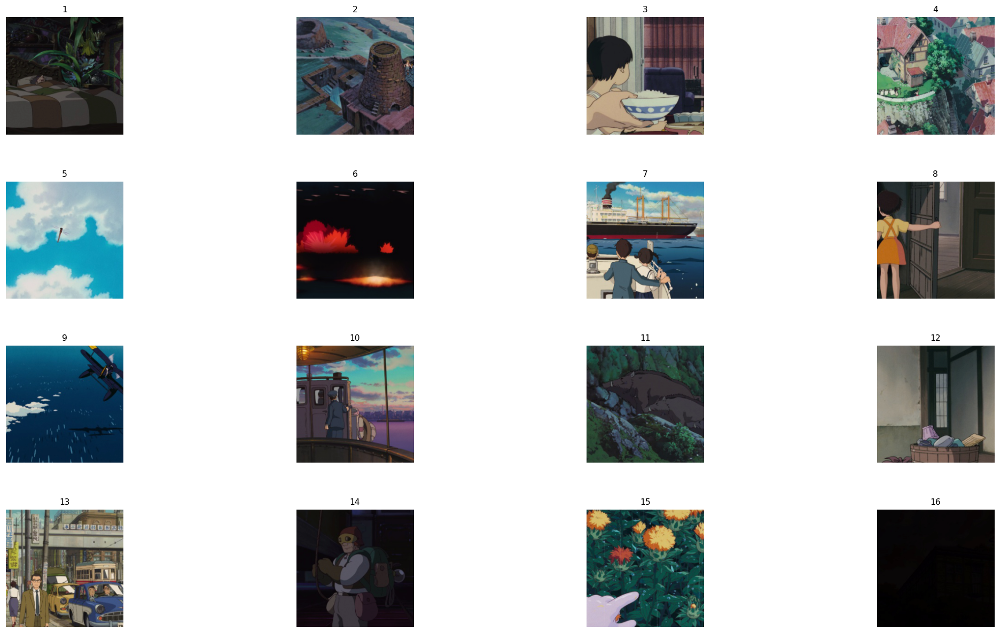

In [12]:
test_cartoon_real_flow = cartoon_real_generator()
print("Expected steps per epoch:", len(test_cartoon_real_flow))
plot_grid(generated_to_images(next(test_cartoon_real_flow)), 4)
del test_cartoon_real_flow

Found 32124 images belonging to 14 classes.
Expected steps per epoch: 2008


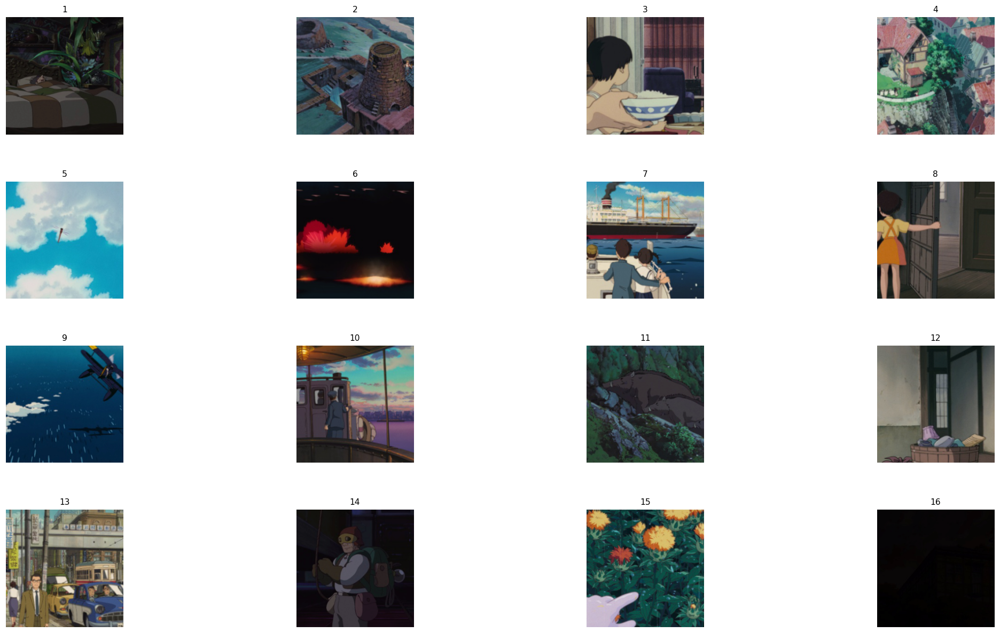

In [13]:
test_cartoon_edge_fake_flow = cartoon_smooth_generator()
print("Expected steps per epoch:", len(test_cartoon_edge_fake_flow))
plot_grid(generated_to_images(next(test_cartoon_edge_fake_flow)), 4)
del test_cartoon_edge_fake_flow

Found 36645 images belonging to 1 classes.
Expected steps per epoch: 2291


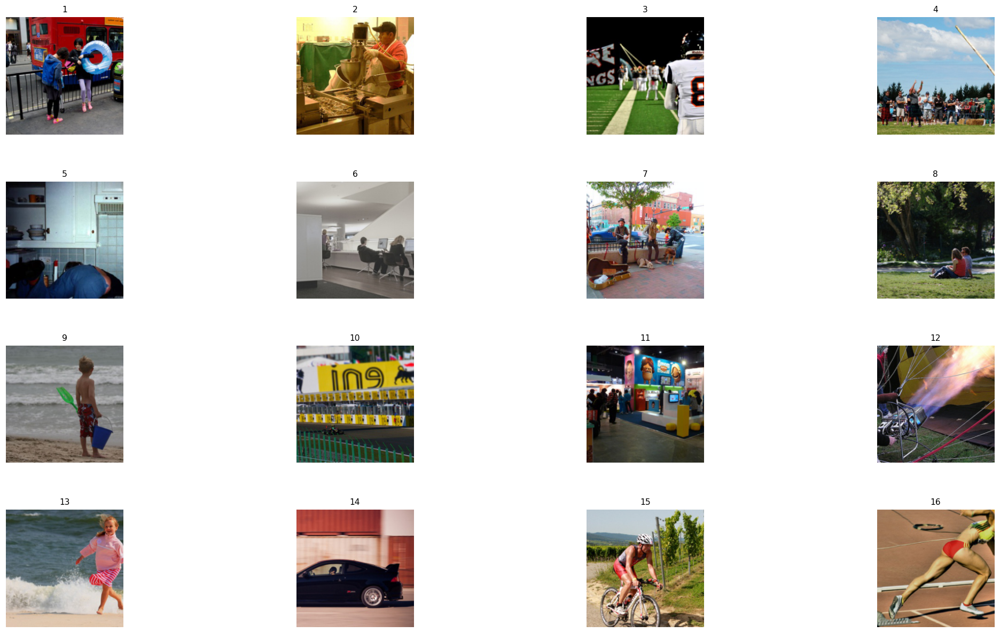

In [14]:
test_real_flow = real_generator()
print("Expected steps per epoch:", len(test_real_flow))
plot_grid(generated_to_images(next(test_real_flow)), 4)
del test_real_flow

Found 32124 images belonging to 14 classes.
Expected steps per epoch: 2008


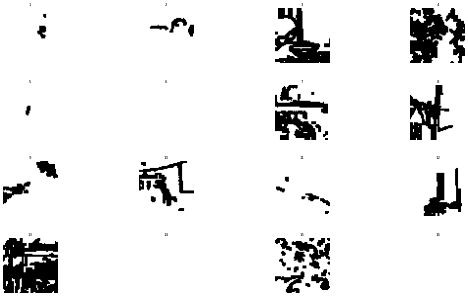

In [15]:
test_mask_flow = smooth_label_generator()
print("Expected steps per epoch:", len(test_mask_flow))
plot_grid(next(test_mask_flow), 4)
del test_mask_flow

# Cartoon-GAN
Implementation of the Cartoon-GAN architecture from the reference paper, this time with Tensorflow and Keras.

In [16]:
# Cartoon-GAN iperparameters
omega = 0.8
vgg_layers = 14

## Custom Convolutional Layers
These layers are use in the paper's architecture but are absent in Keras.

In [17]:
class ReflectionPadding2D(Layer):
  def __init__(self, padding=(1, 1), **kwargs):
    self.padding = tuple(padding)
    # self.input_spec = [InputSpec(ndim=4)]
    super(ReflectionPadding2D, self).__init__(**kwargs)

  def compute_output_shape(self, s):
    if s[1] == None:
      return (None, None, None, s[3])
    return (s[0], s[1] + 2 * self.padding[0], s[2] + 2 * self.padding[1], s[3])

  def call(self, x, mask=None):
    w_pad, h_pad = self.padding
    return tf.pad(x, [[0, 0], [h_pad, h_pad], [w_pad, w_pad], [0, 0]], 'REFLECT')

  def get_config(self):
    config = super(ReflectionPadding2D, self).get_config()
    return config

In [18]:
class Conv2DReflection3x3(Layer):
  def __init__(self, features, stride=1):
    super().__init__()
    self.reflectionPadding2D = ReflectionPadding2D()
    self.conv2d = Conv2D(features, (3,3), strides=(stride, stride), padding='valid', use_bias=False)

  def call(self, inputs, training=True):
    x = self.reflectionPadding2D(inputs, training=training)
    return self.conv2d(x, training=training)

## Discriminator
Based on the Cartoon-GAN discriminator, original code available at [this link](https://github.com/FilipAndersson245/cartoon-gan/blob/5a09f4e2cfad42accfc1792dedfba95f9ab6fb83/models/discriminator.py).

In [19]:
# define the discriminator model
def define_discriminator(image_shape):
  # Constants taken from the paper and the implementation
  alpha = 0.2
  epsilon = 1e-5
  momentum = 0.1

  # source image input
  in_image = Input(shape=image_shape)

  # k3n32s1
  d = Conv2DReflection3x3(32, stride=1)(in_image)
  d = LeakyReLU(alpha=alpha)(d)

  # k3n64s2
  d = Conv2DReflection3x3(64, stride=2)(d)
  d = LeakyReLU(alpha=alpha)(d)
  # k3n128s1
  d = Conv2DReflection3x3(128, stride=1)(d)
  d = BatchNormalization(epsilon=epsilon, momentum=momentum)(d)
  d = LeakyReLU(alpha=alpha)(d)

  # k3n128s2
  d = Conv2DReflection3x3(128, stride=2)(d)
  d = LeakyReLU(alpha=alpha)(d)
  # k3n256s1
  d = Conv2DReflection3x3(256, stride=1)(d)
  d = BatchNormalization(epsilon=epsilon, momentum=momentum)(d)
  d = LeakyReLU(alpha=alpha)(d)

  # feature construction block
  # k3n256s1
  #d = Conv2DReflection3x3(256, stride=1)(d)
  #d = BatchNormalization(epsilon=epsilon, momentum=momentum)(d)
  #d = LeakyReLU(alpha=alpha)(d)

  # patch output
  d = Conv2DReflection3x3(1, stride=1)(d)
  #d = tf.keras.activations.sigmoid(d)

  # define model
  model = Model(in_image, d, name='Discriminator')
  return model

D = define_discriminator(input_shape)

In [20]:
#plot_model(D, show_shapes=True, expand_nested=True)
D.summary()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_reflection3x3 (Conv2  (None, 224, 224, 32)     864       
 DReflection3x3)                                                 
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 224, 224, 32)      0         
                                                                 
 conv2d_reflection3x3_1 (Con  (None, 112, 112, 64)     18432     
 v2DReflection3x3)                                               
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 112, 112, 64)      0         
                                                                 
 conv2d_reflection3x3_2 (Con  (None, 112, 112, 128)  

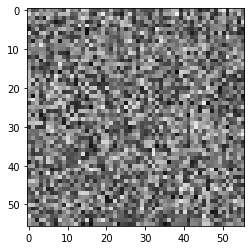

In [21]:
noise = tf.random.normal([1, *input_shape])
label_image = D(noise, training=True)

plt.imshow(tf.sigmoid(label_image[0, :, :, 0]), cmap='gray', vmin=0.0, vmax=1.0)
plt.show()

## Generator
Based on the Cartoon-GAN generator, available at [this link](https://github.com/FilipAndersson245/cartoon-gan/blob/5a09f4e2cfad42accfc1792dedfba95f9ab6fb83/models/generator.py).

In [22]:
# define the generator model
def define_generator(image_shape):
  alpha = 0.2
  epsilon = 1e-5
  momentum = 0.1

  # source image input
  in_image = Input(shape=image_shape)

  # flat block
  # k7n64s1
  g = Conv2D(64, (7,7), strides=1, padding='same', use_bias=False)(in_image)
  g = BatchNormalization(epsilon=epsilon, momentum=momentum)(g)
  g = LeakyReLU(alpha=alpha)(g)

  def down_block(x, n_features):
    # k3n?s2
    x = Conv2DReflection3x3(n_features, stride=2)(x)
    # k3n?s1
    x = Conv2DReflection3x3(n_features, stride=1)(x)
    x = BatchNormalization(epsilon=epsilon, momentum=momentum)(x)
    x = LeakyReLU(alpha=alpha)(x)
    return x

  # 1st down block
  g = down_block(g, 128)

  # 2nd down block
  g = down_block(g, 256)

  def resiual_block(x):
    skip = x
    # k3n256s1
    x = Conv2DReflection3x3(256, stride=1)(x)
    x = BatchNormalization(epsilon=epsilon, momentum=momentum)(x)
    x = LeakyReLU(alpha=alpha)(x)
    # k3n256s1
    x = Conv2DReflection3x3(256, stride=1)(x)
    x = BatchNormalization(epsilon=epsilon, momentum=momentum)(x)
    x = Add()([x, skip])
    x = LeakyReLU(alpha=alpha)(x)
    return x

  for _ in range(8):
    g = resiual_block(g)

  def up_block(x, n_features):
    # k3n?s1/2
    x = Conv2DTranspose(n_features, (3,3), strides=2)(x)
    x = AveragePooling2D(pool_size=(2,2), strides=1)(x)
    # k3n?s1
    x = Conv2DReflection3x3(n_features, stride=1)(x)
    x = BatchNormalization(epsilon=epsilon, momentum=momentum)(x)
    x = LeakyReLU(alpha=alpha)(x)
    return x

  # 1st up block
  g = up_block(g, 128)

  # 2nd up-block
  g = up_block(g, 64)

  # k7n3s1
  output = Conv2D(3, (7,7), strides=1, padding='same')(g)

  # define model
  model = Model(in_image, output, name='Generator')
  return model


G = define_generator(input_shape)

In [23]:
#plot_model(G, show_shapes=True, expand_nested=True)
G.summary()

Model: "Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 224, 224, 64  9408        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_2 (BatchNo  (None, 224, 224, 64  256        ['conv2d_6[0][0]']               
 rmalization)                   )                                                         

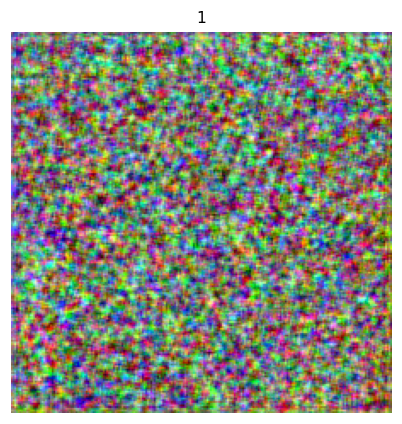

In [24]:
noise = tf.random.normal([1, *input_shape])
generated_image = define_generator(input_shape)(noise, training=True)
plot_grid(generated_to_images(generated_image), 1)

## Loss functions
Loss functions implementation is based on the paper's code as well as on PyTorch source code.

Each loss function treats generator and discriminator outputs as logits, because they don't have the usual last sigmoid layer.

### Binary Cross Entropy

In [25]:
def BCEWithLogitsLoss():
  bce = tf.keras.losses.BinaryCrossentropy(
    from_logits=True,
    reduction=tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE)
  return lambda x, y: bce(y, x)

def BCELoss():
  bce = tf.keras.losses.BinaryCrossentropy(
    from_logits=False,
    reduction=tf.keras.losses.Reduction.SUM_OVER_BATCH_SIZE)
  return lambda x, y: bce(y, x)

def test():
  a = tf.ones((10, 64))
  b = tf.fill((10, 64), 1.5)
  loss = BCEWithLogitsLoss()
  assert abs(loss(b, a).numpy() - 0.2014133) <= 1e-8

  loss = BCELoss()
  assert abs(loss(a, a).numpy() - 0.0) <= 1e-8
test()

### Adversarial Loss
Also called Discriminator loss.

In [26]:
# Penalizes smoothed edges
class AdversarialLoss:
  def __init__(self, cartoon_labels, fake_cartoon_labels):
    self.base_loss = BCEWithLogitsLoss()
    self.cartoon_labels = cartoon_labels
    self.fake_cartoon_labels = fake_cartoon_labels

  def __call__(self, cartoons_outputs, generated_fakes_outputs, cartoon_edge_fakes_outputs, cartoon_edge_fake_labels):
    D_cartoon_loss = self.base_loss(cartoons_outputs, self.cartoon_labels)
    D_generated_fake_loss = self.base_loss(generated_fakes_outputs, self.fake_cartoon_labels)
    D_edge_fake_loss = self.base_loss(cartoon_edge_fakes_outputs, cartoon_edge_fake_labels)

    return D_cartoon_loss + D_generated_fake_loss + D_edge_fake_loss

# Ignores smoothed edges
class SimplifiedAdversarialLoss:
  def __init__(self, cartoon_labels, fake_cartoon_labels):
    self.base_loss = BCEWithLogitsLoss()
    self.cartoon_labels = cartoon_labels
    self.fake_cartoon_labels = fake_cartoon_labels

  def __call__(self, cartoons_outputs, generated_fakes_outputs):
    D_cartoon_loss = self.base_loss(cartoons_outputs, self.cartoon_labels)
    D_generated_fake_loss = self.base_loss(generated_fakes_outputs, self.fake_cartoon_labels)

    return D_cartoon_loss + D_generated_fake_loss

def test():
  loss = AdversarialLoss(np.ones((10, 56, 56)), np.zeros((10, 56, 56)))
  cartoon_edge_fake_labels = np.zeros((10, 56, 56))
  cartoon = tf.fill((10, 56, 56), 0.6)
  gf = tf.fill((10, 56, 56), 0.4)
  cartoon_edge = tf.fill((10, 56, 56), 0.3)
  l1 = loss(cartoon, gf, cartoon_edge, cartoon_edge_fake_labels)

  cartoon = tf.fill((10, 56, 56), 0.9)
  gf = tf.fill((10, 56, 56), 0.3)
  cartoon_edge = tf.fill((10, 56, 56), 0.2)
  l2 = loss(cartoon, gf, cartoon_edge, cartoon_edge_fake_labels)

  cartoon = tf.fill((10, 56, 56), 0.99)
  gf = tf.fill((10, 56, 56), 0.01)
  cartoon_edge = tf.fill((10, 56, 56), 0.01)
  l3 = loss(cartoon, gf, cartoon_edge, cartoon_edge_fake_labels)
  assert l1 > l2 > l3 > 0
  
  loss = SimplifiedAdversarialLoss(np.ones((10, 56, 56)), np.zeros((10, 56, 56)))
  cartoon = tf.fill((10, 56, 56), 0.6)
  gf = tf.fill((10, 56, 56), 0.4)
  l1 = loss(cartoon, gf)

  cartoon = tf.fill((10, 56, 56), 0.9)
  gf = tf.fill((10, 56, 56), 0.3)
  l2 = loss(cartoon, gf)
  
  cartoon = tf.fill((10, 56, 56), 0.99)
  gf = tf.fill((10, 56, 56), 0.01)
  l3 = loss(cartoon, gf)
  assert l1 > l2 > l3 > 0
test()

### Content Loss
Used to force content fidelty in the generator.
It's based on the paper implementation, which uses a pre-trained part VGG16  (the first n layers) to detect image contents.

The original content loss used the first 16 layers of VGG16, while we found a little better results with 14.

The layer depth regulates how high level content features should be compared.

In [27]:
vgg16_wights_path = 'ImageNet/Keras/weights/vgg16_imagenet.h5'
!curl https://raw.githubusercontent.com/ezavarygin/vgg16_pytorch2keras/master/vgg16_pytorch2keras.h5 \
  --create-dirs -o "$vgg16_wights_path"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 56.1M  100 56.1M    0     0  36.5M      0  0:00:01  0:00:01 --:--:-- 36.4M


In [28]:
from tensorflow.keras.applications import vgg16

vgg16_model = vgg16.VGG16(include_top=False, 
                    weights=vgg16_wights_path, 
                    input_shape=input_shape,
                    )

vgg16_model.trainable = False
for l in vgg16_model.layers:
  l.trainable = False
vgg16_cut = Sequential(vgg16_model.layers[:vgg_layers], name="ContentLoss_VGG16")
vgg16_cut.layers[-1].activation = None
vgg16_cut.trainable = False
vgg16_cut.summary()

class ContentLoss:
  def __init__(self):
    def perc(img):
      return vgg16_cut(img, training=False)
    self.perception = perc
  
  def __call__(self, outputs, targets):
    diff = self.perception(outputs) - self.perception(targets)
    k = tf.math.reduce_mean(tf.math.abs(diff))
    return k

def test():
  loss = ContentLoss()
  outputs = normalize(tf.fill((10, 224, 224, 3), 0.5))
  assert loss(outputs, outputs) == 0.0
  inputs = normalize(tf.fill((10, 224, 224, 3), 1.0))
  assert loss(outputs, inputs) > 0.0
  # This test works onlly with 16 layers, the same as the paper
  #inputs = normalize(tf.fill((10, 224, 224, 3), 0.8))
  #assert abs(loss(outputs, inputs) - 0.24931535) <= 1e-6
test()

Model: "ContentLoss_VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256) 

### Generator Loss
Enforces both discriminator fooling and content fidelty from the original input image.
**Omega** is the most important iperparameter: it regulates how much of the content fidelty can be sacrificed in favor of more freedom to draw anime styled cartoons.

In [29]:
class GeneratorLoss:
  def __init__(self, cartoon_labels, omega=7):
    self.omega = tf.constant(omega, dtype=tf.float32)
    self.content_loss = ContentLoss()
    self.base_loss = BCEWithLogitsLoss()
    self.cartoon_labels = cartoon_labels
  
  def __call__(self, outputs, inputs, outputs_labels):
    return self.base_loss(outputs_labels, self.cartoon_labels) + self.omega * self.content_loss(outputs, inputs)

def test():
  loss = GeneratorLoss(tf.ones((10, 56, 56)), omega=100)
  outputs_labels = tf.fill((10, 56, 56), 1.0)
  outputs = tf.fill((10, 224, 224, 3), 0.0)
  assert loss(outputs, outputs, outputs_labels) == 0.31326172
  
  loss = GeneratorLoss(tf.ones((10, 56, 56)), omega=10)
  outputs_labels = tf.fill((10, 56, 56), 0.5)
  outputs = tf.fill((10, 224, 224, 3), 0.0)
  assert loss(outputs, outputs, outputs_labels) > 0.0
  
  loss = GeneratorLoss(tf.ones((10, 56, 56)), omega=100)
  outputs_labels = tf.fill((10, 56, 56), 1.0)
  outputs = tf.fill((10, 224, 224, 3), 0.0)
  inputs = tf.fill((10, 224, 224, 3), 1.0)
  assert loss(outputs, inputs, outputs_labels) > 0.0
test()

## Learning Rate
We added cyclical learning rate instead of fixed in order to escape local minimum / maximum quicker.

In [30]:
cyclical_learning_rate = CyclicalLearningRate(
    initial_learning_rate=1e-3,
    maximal_learning_rate=1e-2,
    step_size=batch_size * 2,
    scale_fn=lambda x: 1 / (2. ** (x - 1))
  )

In [31]:
learning_rate = cyclical_learning_rate #1e-3
beta1, beta2 = (.5, .99)
weight_decay = 1e-4

In [32]:
discriminator_optimizer = tfa.optimizers.AdamW(
    learning_rate=learning_rate, 
    beta_1=beta1, beta_2=beta2,
    weight_decay=weight_decay
)
generator_optimizer = tfa.optimizers.AdamW(
    learning_rate=learning_rate, 
    beta_1=beta1, beta_2=beta2,
    weight_decay=weight_decay
)

## Metrics

### FID

[Fréchet inception distance](https://en.wikipedia.org/wiki/Fr%C3%A9chet_inception_distance).

In [33]:
model_inception_v3 = InceptionV3(include_top=False, pooling='avg', input_shape=input_shape)

87924736/87910968 [==============================] - 1s 0us/step


In [34]:
# calculate frechet inception distance
def calculate_fid(_model, images1, images2):
  # calculate activations
  act1 = _model.predict(images1)
  act2 = _model.predict(images2)
  
  # calculate mean and covariance statistics
  mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
  mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
  
  # calculate sum squared difference between means
  ssdiff = np.sum((mu1 - mu2) ** 2.0)
  
  # calculate sqrt of product between cov
  covmean = sqrtm(sigma1.dot(sigma2))
  
  # check and correct imaginary numbers from sqrt
  if iscomplexobj(covmean):
    covmean = covmean.real
  
  # calculate score
  fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
  return fid

def evaluate_fid(base_images, test_images):
  return calculate_fid(model_inception_v3, base_images, test_images)

# pre_evaluate fid for cartoon
# calculate activations over cartoon val
cartoon_gen = cartoon_real_validation_generator()
act_cartoon_gen = model_inception_v3.predict(cartoon_gen)
mu_cartoon_gen = act_cartoon_gen.mean(axis=0)
sigma_cartoon_gen = cov(act_cartoon_gen, rowvar=False)

def evaluate_fid_with_cartoon_val(images, 
                                  mu_cartoon_gen=mu_cartoon_gen, 
                                  sigma_cartoon_gen=sigma_cartoon_gen):
  actual_n_images = len(act_cartoon_gen)

  # calculate activations cap to actual_n_images
  act2 = model_inception_v3.predict(images)[:actual_n_images]
  if len(act2) < actual_n_images:
    act_cartoon_gen_crop = act_cartoon_gen[:len(act2)]
    mu_cartoon_gen = act_cartoon_gen_crop.mean(axis=0)
    sigma_cartoon_gen = cov(act_cartoon_gen_crop, rowvar=False)
  
  # calculate mean and covariance statistics
  mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
  
  # calculate sum squared difference between means
  ssdiff = np.sum((mu_cartoon_gen - mu2) ** 2.0)
  
  # calculate sqrt of product between cov
  covmean = sqrtm(sigma_cartoon_gen.dot(sigma2))
  
  # check and correct imaginary numbers from sqrt
  if iscomplexobj(covmean):
    covmean = covmean.real
  
  # calculate score
  fid = ssdiff + trace(sigma_cartoon_gen + sigma2 - 2.0 * covmean)
  return fid

Found 8026 images belonging to 14 classes.


## Checkpoints & History
In order to save time and enable pretrained model loading, we save progress checkpoints at each epoch.

In [35]:
local_checkpoint_location = './training_checkpoints/'
local_pretrain_checkpoint_location = './pretraining_checkpoints'
history_file_name = 'history.csv'
history_header = ['epoch', 
                  'train_discriminator_loss_mean', 
                  'train_discriminator_loss_std',
                  'train_generator_loss_mean', 
                  'train_generator_loss_std', 
                  'val_discriminator_loss_mean', 
                  'val_discriminator_loss_std',
                  'val_generator_loss_mean', 
                  'val_generator_loss_std',
                  'fid_score'
                  ]
history_file_path = path.join(local_checkpoint_location, history_file_name)

def reset_history():
  with open(history_file_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    writer.writerow(history_header)

def history_append(epoch, 
                   train_discriminator_loss_mean, 
                   train_discriminator_loss_std, 
                   train_generator_loss_mean, 
                   train_generator_loss_std, 
                   val_discriminator_loss_mean,
                   val_discriminator_loss_std,
                   val_generator_loss_mean,
                   val_generator_loss_std,
                   fid_score):
  with open(history_file_path, 'a', newline='') as csvfile:
    writer = csv.writer(csvfile, delimiter=',')
    writer.writerow([epoch, 
                   train_discriminator_loss_mean, 
                   train_discriminator_loss_std, 
                   train_generator_loss_mean, 
                   train_generator_loss_std, 
                   val_discriminator_loss_mean,
                   val_discriminator_loss_std,
                   val_generator_loss_mean,
                   val_generator_loss_std,
                   fid_score])

#### Google Drive checkpoint backup

In [36]:
use_google_drive = False #@param {type:'boolean'}
use_pretrained_weights = True #@param {type: 'boolean'}
google_drive_checkpoint_path = 'Anime-Frames/Checkpoints-test' #@param {type: 'string'}
reset_checkpoints = False #@param {type: 'boolean'}
google_drive_root = '/content/drive/'
google_drive_checkpoint_location = path.join(google_drive_root, 'MyDrive', google_drive_checkpoint_path)
image_directory = os.path.join(local_checkpoint_location, 'images')

if use_google_drive:
  from google.colab import drive
  drive.mount(google_drive_root)
  os.makedirs(google_drive_checkpoint_location, exist_ok=True)
  shutil.rmtree(local_checkpoint_location, ignore_errors=True)
  shutil.copytree(google_drive_checkpoint_location, local_checkpoint_location)
  print(f'Local files at {local_checkpoint_location} will be backed inside {google_drive_checkpoint_location}')
elif not reset_checkpoints and use_pretrained_weights:
  !gdown --id 1VtSpDNsEOXEaCVMU85JakXVQ9KX-jJuH -O 'pretrained.zip'
  !unzip -o 'pretrained.zip' -d $local_checkpoint_location
else:
  try:
    drive.flush_and_unmount()
    !rm -rf /content/drive
  except:
    pass


if reset_checkpoints:
  shutil.rmtree(local_checkpoint_location, ignore_errors=True)
if not path.isfile(history_file_path):
  os.makedirs(local_checkpoint_location, exist_ok=True)
  reset_history()
if reset_checkpoints:
  !rm -rf $image_directory
!mkdir -p $image_directory

Downloading...
From: https://drive.google.com/uc?id=1VtSpDNsEOXEaCVMU85JakXVQ9KX-jJuH
To: /content/pretrained.zip
100% 398M/398M [00:02<00:00, 164MB/s]
Archive:  pretrained.zip
  inflating: ./training_checkpoints/checkpoint  
  inflating: ./training_checkpoints/ckpt-17.data-00000-of-00001  
  inflating: ./training_checkpoints/ckpt-17.index  
  inflating: ./training_checkpoints/ckpt-18.data-00000-of-00001  
  inflating: ./training_checkpoints/ckpt-18.index  
  inflating: ./training_checkpoints/ckpt-19.data-00000-of-00001  
  inflating: ./training_checkpoints/ckpt-19.index  
  inflating: ./training_checkpoints/history.csv  


#### Checkpoint manager

In [37]:
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=G,
                                 discriminator=D,
                                 epoch=tf.Variable(0))
checkpoint_manager = tf.train.CheckpointManager(checkpoint,
                                                local_checkpoint_location,
                                                max_to_keep=10,
                                                keep_checkpoint_every_n_hours=2)

#### Image generation during train
The images were manually chosen to show a wide variety of scenarios.

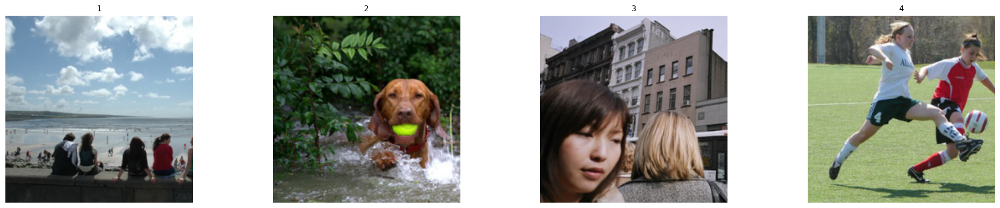

In [38]:
path_to_folder = os.path.join(flickr30k_folder, 'flickr30k-images-out','real', 'left')
imgs = ['1048710776.jpg',  # sea + sky + people
        '1130369873.jpg',  # dog + forest
        '100197432.jpg',   # urban city + face
        '123101580.jpg'    # sport + body + grass
       ]
selected_imgs = list(map(lambda x: os.path.join(path_to_folder, x), imgs))

test_images = np.array([rescale_and_normalize(np.array(Image.open(i).resize((input_shape[:2])))) for i in selected_imgs])

plot_grid(np.array([generated_to_images(x) for x in test_images]), columns=4)

In [39]:
class ImageSaver:
  def __init__(self, epoch_variable, real_images=None, n_images=4):
    self.n_images = n_images
    self.directory = image_directory
    self.epoch_variable = epoch_variable
    if real_images is None:
      # extract random real images
      real_gen = real_validation_generator()
      self.real_batch = next(real_gen)[:self.n_images]
    else:
      # use given images
      self.real_batch = real_images
    cartoon_gen = cartoon_real_validation_generator()
    self.cartoon_batch = next(cartoon_gen)[:self.n_images]
    smooth_gen = cartoon_smooth_validation_generator()
    self.smooth_batch = next(smooth_gen)[:self.n_images]
    smooth_label_gen = smooth_label_validation_generator()
    self.smooth_label_batch = np.squeeze(next(smooth_label_gen)[:self.n_images])
  
  def save_images(self, D, G):
    real_images = self.real_batch
    cartoon_images = self.cartoon_batch
    smooth_images = self.smooth_batch

    real_images_G = G(real_images, training=False)
    real_to_cartoon_images = generated_to_images(real_images_G)
    
    generator_list = np.concatenate([generated_to_images(real_images), real_to_cartoon_images])
    
    real_to_cartoon_images_discriminator = self._labels_to_images(D(real_images_G, training=False))
    cartoon_real_discriminator = self._labels_to_images(D(cartoon_images, training=False))
    smooth_discriminator = self._labels_to_images(D(smooth_images, training=False))
    discriminator_list = np.concatenate([cartoon_real_discriminator, smooth_discriminator, self.smooth_label_batch, real_to_cartoon_images_discriminator])

    save_plot_grid(generator_list, 
                   self.n_images, 
                   name=f'generator{self.epoch_variable.numpy()}', 
                   directory=self.directory, 
                   title=f'Epoch {self.epoch_variable.numpy()}', 
                   labels=['Real images', 'Generated images'],
                   font_size=1.5)
    save_plot_grid(discriminator_list, 
                   self.n_images, 
                   name=f'discriminator{self.epoch_variable.numpy()}',
                   directory=self.directory, 
                   title=f'Epoch {self.epoch_variable.numpy()}',
                   labels=['cartoon images', 'smoothed images', 'smoothed label', 'real images'],
                   font_size=2.)
  
  def _labels_to_images(self, labels):
    return tf.sigmoid(labels).numpy().squeeze()

  def _G_to_images(self, images, G):
    return generated_to_images(G(images))

# ImageSaver test
ImageSaver(tf.constant(-1), real_images=test_images).save_images(D, G)
os.remove(os.path.join(image_directory, 'discriminator-1.png'))
os.remove(os.path.join(image_directory, 'generator-1.png'))

Found 8026 images belonging to 14 classes.
Found 8026 images belonging to 14 classes.
Found 8026 images belonging to 14 classes.


## Pretraining
We make generator learn the identity function with the content loss and the discriminator learn how to distinguish ...

In [40]:
def pretrain():
  crg = real_generator()
  x = map(lambda x: (x, x), crg)
  crvg = real_validation_generator()
  x_val = map(lambda x: (x, x), crvg)
  content_loss = ContentLoss()
  
  G.compile(optimizer=tfa.optimizers.AdamW(
              learning_rate=1e-3,
              beta_1=.5, beta_2=.99,
              weight_decay=1e-3
        ),
        loss=lambda img_true, img_pred: content_loss(img_pred, img_true),
        metrics=[]
       )
  G.fit(x=x,
        epochs=10,
        steps_per_epoch=len(crg),
        validation_data=x_val,
        validation_steps=len(crvg),
        shuffle=True
       )

In [41]:
checkpoint.restore(checkpoint_manager.latest_checkpoint)
if checkpoint_manager.latest_checkpoint and len(checkpoint_manager.checkpoints) == 1:
  print(f'Restored pretrain from {checkpoint_manager.latest_checkpoint}.')
elif checkpoint_manager.latest_checkpoint and len(checkpoint_manager.checkpoints) > 1:
  print(f'Restored train from {checkpoint_manager.latest_checkpoint}.')
  print("Skipping pretraining: training was already started.")
else:
  pretrain()
  checkpoint_manager.save()
  if use_google_drive:
    shutil.rmtree(google_drive_checkpoint_location)
    shutil.copytree(checkpoint_manager.directory, google_drive_checkpoint_location)

Restored train from ./training_checkpoints/ckpt-19.
Skipping pretraining: training was already started.


Found 9161 images belonging to 1 classes.
Found 8026 images belonging to 14 classes.


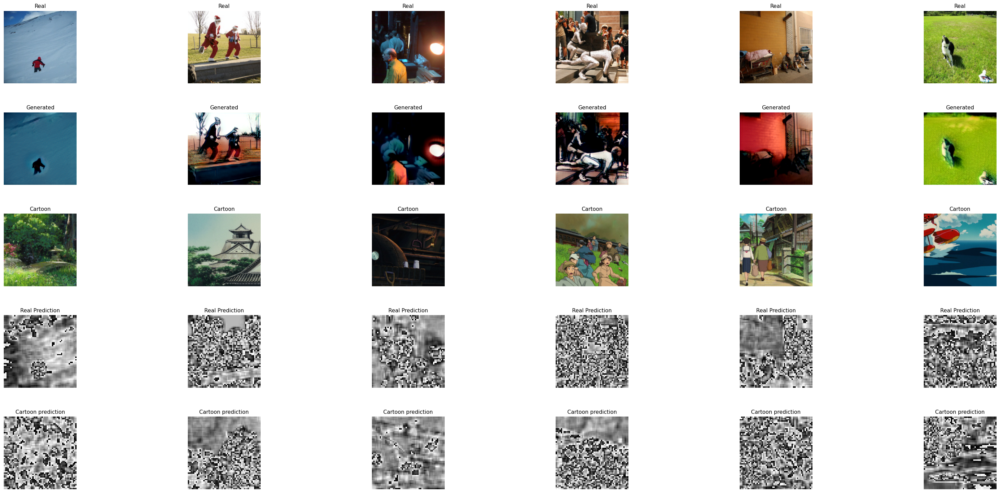

In [42]:
def pretrain_result():
  it = real_validation_generator()
  real_batch = next(it)[:6]
  generated_batch = G(real_batch, training=False)
  to_plot = []
  to_plot.extend(generated_to_images(real_batch))
  to_plot.extend(generated_to_images(generated_batch))
  it = cartoon_real_validation_generator()
  cartoon_batch = next(it)[:6]
  to_plot.extend(generated_to_images(cartoon_batch))
  discriminated_batch = D(real_batch, training=False).numpy()
  to_plot.extend(discriminated_batch)
  discriminated_batch = D(cartoon_batch, training=False).numpy()
  to_plot.extend(discriminated_batch)
  size = len(real_batch)
  plot_grid(to_plot, size, labels=["Real"] * size + ["Generated"] * size + ["Cartoon"] * size + ["Real Prediction"] * size + ["Cartoon prediction"] * size)
pretrain_result()

## Training

### Implementation

In [43]:
class CartoonGAN:
  def __init__(self,
               checkpoint,
               checkpoint_manager,
               cartoon_real_generator,
               cartoon_smooth_generator,
               real_image_generator,
               smooth_label_generator,
               cartoon_real_generator_val,
               cartoon_smooth_generator_val,
               real_image_generator_val,
               smooth_label_generator_val,
               starting_epoch=None):
    self.name = 'Cartoon-GAN'
    
    self.checkpoint = checkpoint
    self.checkpoint_manager = checkpoint_manager
    # Checkpoint restore
    if starting_epoch is None:
      if checkpoint_manager.latest_checkpoint:
        print("-----------Restoring from {}-----------".format(
            checkpoint_manager.latest_checkpoint))
        checkpoint.restore(checkpoint_manager.latest_checkpoint)
      else:
        print("-----------Initializing from scratch-----------")
    else:    
      checkpoint_fname = local_checkpoint_location + 'ckpt-' + str(starting_epoch)
      print("-----------Restoring from {}-----------".format(checkpoint_fname))
      checkpoint.restore(checkpoint_fname)

    self.discriminator = checkpoint.discriminator
    self.generator = checkpoint.generator
    self.d_optimizer = checkpoint.discriminator_optimizer
    self.g_optimizer = checkpoint.generator_optimizer

    self.cartoon_real_generator = cartoon_real_generator # cartoon real gen train
    self.cartoon_smooth_generator = cartoon_smooth_generator # cartoon smooth gen train
    self.cartoon_smooth_generator_val = cartoon_smooth_generator_val # cartoon smooth gen val
    self.cartoon_real_generator_val = cartoon_real_generator_val # cartoon real gen val
    self.real_image_generator = real_image_generator # real image gen train
    self.real_image_generator_val = real_image_generator_val # real image gen val
    self.smooth_label_generator = smooth_label_generator # smooth labels train
    self.smooth_label_generator_val = smooth_label_generator_val # smooth labels val
    
    self.batches_per_epoch = min(len(self.cartoon_real_generator), len(self.real_image_generator)) - 1 # Last batch has unknown size
    self.val_batches_per_epoch = min(len(self.cartoon_real_generator_val), len(self.real_image_generator_val)) - 1 # Last batch has unknown size

    self.cartoon_labels = tf.ones((*D.compute_output_shape((batch_size, *input_shape)),))
    self.fake_cartoon_labels = tf.zeros((*D.compute_output_shape((batch_size, *input_shape)),))

    self.d_loss_fn = AdversarialLoss(self.cartoon_labels, self.fake_cartoon_labels)
    self.g_loss_fn = GeneratorLoss(self.cartoon_labels, omega=omega)
    self.bar_format = '{bar}{desc}: {percentage:3.0f}% {r_bar}'

    self.image_saver = ImageSaver(epoch_variable=self.checkpoint.epoch)

    self.eval_fid = evaluate_fid_with_cartoon_val

  @tf.function
  def _step(self,
              x_cartoon_batch_train,
              x_real_train,
              x_cartoon_smooth_batch_train,
              y_cartoon_smooth_batch_train):
    generated_real_train = self.generator(x_real_train, training=True)

    with tf.GradientTape() as disc_tape:  
      # Discriminator loss
      predictions_cartoon_train = self.discriminator(x_cartoon_batch_train, training=True)
      predictions_generated_train = self.discriminator(generated_real_train, training=True)
      predictions_cartoon_smooth_train = self.discriminator(x_cartoon_smooth_batch_train, training=True)
      d_loss = self.d_loss_fn(predictions_cartoon_train, predictions_generated_train, predictions_cartoon_smooth_train, y_cartoon_smooth_batch_train)
    
    gradients_of_discriminator = disc_tape.gradient(d_loss, self.discriminator.trainable_variables)
    self.d_optimizer.apply_gradients(
        zip(gradients_of_discriminator, self.discriminator.trainable_variables)
    )

    with tf.GradientTape() as gen_tape:
      # Generator loss
      generated_real_train = self.generator(x_real_train, training=True)
      generated_real_labels = self.discriminator(generated_real_train, training=True)
      g_loss = self.g_loss_fn(generated_real_train, x_real_train, generated_real_labels)
    
    gradients_of_generator = gen_tape.gradient(g_loss, self.generator.trainable_variables)
    self.g_optimizer.apply_gradients(
        zip(gradients_of_generator, self.generator.trainable_variables)
    )

    return d_loss, g_loss

  @tf.function
  def _val_step(self,
              x_cartoon_batch_val,
              x_real_val,
              x_cartoon_smooth_batch_val,
              y_cartoon_smooth_batch_val):

    generated_real_val = self.generator(x_real_val, training=False)
    
    # Discriminator loss
    predictions_cartoon_val = self.discriminator(x_cartoon_batch_val, training=False)
    predictions_generated_val = self.discriminator(generated_real_val, training=False)
    predictions_cartoon_smooth_val = self.discriminator(x_cartoon_smooth_batch_val, training=False)
    d_loss = self.d_loss_fn(predictions_cartoon_val, predictions_generated_val, predictions_cartoon_smooth_val, y_cartoon_smooth_batch_val)

    # Generator loss (could have been computed from discriminator after one step of training)
    generated_real_labels = self.discriminator(generated_real_val, training=False)
    g_loss = self.g_loss_fn(generated_real_val, x_real_val, generated_real_labels)

    return d_loss, g_loss

  def train(self, epochs):
    starting_epoch = int(self.checkpoint.epoch)
    for epoch in tqdm(range(starting_epoch, epochs),
                      total=epochs,
                      initial=starting_epoch,
                      position=0,
                      desc=f'Training model {self.name}',
                      bar_format=self.bar_format):

      # train phase
      epoch_progress = tqdm(range(self.batches_per_epoch), 
                            total=self.batches_per_epoch, 
                            position=1,
                            desc=f'Training epoch {epoch}',
                            bar_format=self.bar_format)
      train_d_loss_sum = 0
      train_d_loss_sum_squared = 0
      train_g_loss_sum = 0
      train_g_loss_sum_squared = 0
      train_step_count = 0
      
      for (step,
          x_cartoon_batch_train, 
          x_cartoon_smooth_batch_train, 
          x_real_train,
          y_cartoon_smooth_batch_train) in zip(
             epoch_progress,
             self.cartoon_real_generator, 
             self.cartoon_smooth_generator,
             self.real_image_generator,
             self.smooth_label_generator):

        d_loss, g_loss = self._step(x_cartoon_batch_train,
                                    x_real_train,
                                    x_cartoon_smooth_batch_train,
                                    y_cartoon_smooth_batch_train)
        d_loss = d_loss.numpy()
        g_loss = g_loss.numpy()
        
        epoch_progress.set_postfix({
          'Discriminator Loss' : f'{d_loss:.4f}',
          'Generator Loss' : f'{g_loss:.4f}'
        })
        
        train_d_loss_sum += d_loss
        train_d_loss_sum_squared += d_loss * d_loss
        train_g_loss_sum += g_loss
        train_g_loss_sum_squared += g_loss * g_loss
        train_step_count += 1
        
      self.cartoon_real_generator.reset()
      self.cartoon_smooth_generator.reset()
      self.real_image_generator.reset()
      self.smooth_label_generator.reset()
      
      # Compute mean loss and variance for historical data
      train_d_loss_mean = train_d_loss_sum / train_step_count
      train_d_loss_std = np.sqrt(train_d_loss_sum_squared / train_step_count - train_d_loss_mean * train_d_loss_mean)
      train_g_loss_mean = train_g_loss_sum / train_step_count
      train_g_loss_std = np.sqrt(train_g_loss_sum_squared / train_step_count - train_g_loss_mean * train_g_loss_mean)

      # validation phase
      epoch_val_progress = tqdm(total=self.val_batches_per_epoch,
                                position=1,
                                desc=f'Validation epoch {epoch}',
                                bar_format=self.bar_format)
      val_d_loss_sum = 0
      val_d_loss_sum_squared = 0
      val_g_loss_sum = 0
      val_g_loss_sum_squared = 0
      val_step_count = 0
      
      for crgv, csgv, rigv, slgv, _ in zip(self.cartoon_real_generator_val, 
                                     self.cartoon_smooth_generator_val, 
                                     self.real_image_generator_val,
                                     self.smooth_label_generator_val,
                                     range(self.val_batches_per_epoch)):
        
        d_val_loss, g_val_loss = self._val_step(crgv, rigv, csgv, slgv)
        d_val_loss = d_val_loss.numpy()
        g_val_loss = g_val_loss.numpy()
        
        val_d_loss_sum += d_val_loss
        val_d_loss_sum_squared += d_val_loss * d_val_loss
        val_g_loss_sum += g_val_loss
        val_g_loss_sum_squared += g_val_loss * g_val_loss
        val_step_count += 1
        
        epoch_val_progress.update(1)
      
      # Compute mean loss and variance for historical data
      val_d_loss_mean = val_d_loss_sum / val_step_count
      val_d_loss_std = np.sqrt(val_d_loss_sum_squared / val_step_count - val_d_loss_mean * val_d_loss_mean)
      val_g_loss_mean = val_g_loss_sum / val_step_count
      val_g_loss_std = np.sqrt(val_g_loss_sum_squared / val_step_count - val_g_loss_mean * val_g_loss_mean)
      
      epoch_val_progress.set_postfix({
        'Discriminator Loss' : f'{val_d_loss_mean:.4f}',
        'Generator Loss' : f'{val_g_loss_mean:.4f}'
      })
      epoch_val_progress.close()
      
      self.cartoon_real_generator_val.reset()
      self.cartoon_smooth_generator_val.reset()
      self.real_image_generator_val.reset()
      self.smooth_label_generator_val.reset()

      # evaluation of FID score
      fid_score = self.eval_fid(self.real_image_generator_val)
      print('FID for epoch[', epoch, '] =', fid_score)
      self.real_image_generator_val.reset()

      # checkpoint phase
      epoch_checkpoint_progress = tqdm(total=4 if use_google_drive else 3,
                                 position=1,
                                 desc=f'Saving model checkpoints and history for epoch {epoch}',
                                 bar_format=self.bar_format)
      self.checkpoint.epoch.assign_add(1)
      save_path = self.checkpoint_manager.save()
      epoch_checkpoint_progress.update(1)
      epoch_checkpoint_progress.set_description(f'Saved checkpoint for epoch {epoch}: {save_path}')
      
      if use_google_drive:
        shutil.rmtree(google_drive_checkpoint_location)
        shutil.copytree(self.checkpoint_manager.directory, google_drive_checkpoint_location)
        epoch_checkpoint_progress.update(1)
        epoch_checkpoint_progress.set_description(f'Saved checkpoint backup for epoch {epoch}: {save_path} -> {google_drive_checkpoint_location}')
      
      # history save
      history_append(epoch, 
                     train_d_loss_mean, train_d_loss_std, 
                     train_g_loss_mean, train_g_loss_std, 
                     val_d_loss_mean, val_d_loss_std, 
                     val_g_loss_mean, val_g_loss_std, 
                     fid_score)
      epoch_checkpoint_progress.update(1)
      epoch_checkpoint_progress.set_description(f'Saved history for epoch {epoch}')

      # training image save
      self.image_saver.save_images(self.discriminator, self.generator)
      epoch_checkpoint_progress.update(1)
      epoch_checkpoint_progress.set_description(f'Saved images for epoch {epoch}')
      
      epoch_checkpoint_progress.close()


In [44]:
model = CartoonGAN(checkpoint,
                   checkpoint_manager,
                   cartoon_real_generator(), 
                   cartoon_smooth_generator(), 
                   real_generator(),
                   smooth_label_generator(),
                   cartoon_real_validation_generator(),
                   cartoon_smooth_validation_generator(),
                   real_validation_generator(),
                   smooth_label_validation_generator())

Found 32124 images belonging to 14 classes.
Found 32124 images belonging to 14 classes.
Found 36645 images belonging to 1 classes.
Found 32124 images belonging to 14 classes.
Found 8026 images belonging to 14 classes.
Found 8026 images belonging to 14 classes.
Found 9161 images belonging to 1 classes.
Found 8026 images belonging to 14 classes.
-----------Restoring from ./training_checkpoints/ckpt-19-----------
Found 9161 images belonging to 1 classes.
Found 8026 images belonging to 14 classes.
Found 8026 images belonging to 14 classes.
Found 8026 images belonging to 14 classes.


### Training

In [45]:
model.train(16)

          Training model Cartoon-GAN:   0% | 17/? [00:00<?, ?it/s]

### Plot result
Plot the training progress summary for both generator and discriminator.

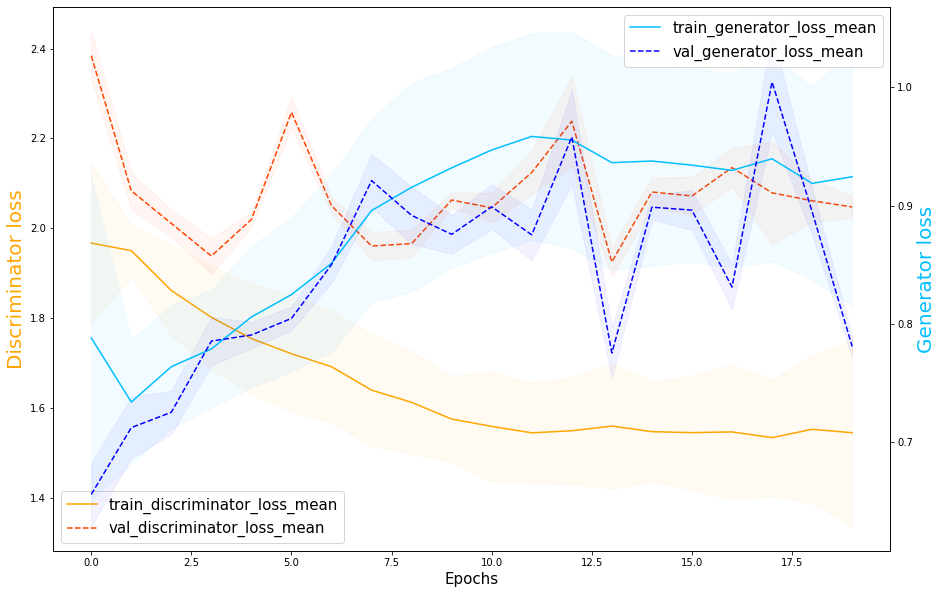

In [46]:
df = pd.read_csv(history_file_path, sep=',', header=0)
df = df.set_index('epoch')

fig, ax1 = plt.subplots(1, figsize=(15,10))
x = df.index
ax1.set_xlabel('Epochs', fontsize=15)

mean_d, std_d = ('train_discriminator_loss_mean', 'train_discriminator_loss_std')
mean_g, std_g = ('train_generator_loss_mean', 'train_generator_loss_std')
val_mean_d, val_std_d = ('val_discriminator_loss_mean', 'val_discriminator_loss_std')
val_mean_g, val_std_g = ('val_generator_loss_mean', 'val_generator_loss_std')

# plot discriminator training
y = df[mean_d]
err = df[std_d]
line, = ax1.plot(x, y, label=mean_d, color='orange')
ax1.fill_between(x, y - err, y + err, alpha=0.05, color=line.get_color())
ax1.set_ylabel('Discriminator loss', fontsize=20, color = line.get_color())

# plot discriminator validation
y = df[val_mean_d]
err = df[val_std_d]
line, = ax1.plot(x, y, '--', label=val_mean_d, color='orangered')
ax1.fill_between(x, y - err, y + err, alpha=0.05, color=line.get_color())

_ = ax1.legend(loc='lower left', fontsize=15)

ax2=ax1.twinx()

y = df[mean_g]
err = df[std_g]
line, = ax2.plot(x, y, label=mean_g, color='deepskyblue')
ax2.fill_between(x, y - err, y + err, alpha=0.05, color=line.get_color())
ax2.set_ylabel('Generator loss', fontsize=20, color = line.get_color())

# plot discriminator validation
y = df[val_mean_g]
err = df[val_std_g]
line, = ax2.plot(x, y, '--', label=val_mean_g, color='blue')
ax2.fill_between(x, y - err, y + err, alpha=0.05, color=line.get_color())

_ = ax2.legend(loc='upper right', fontsize=15,)

plt.rcParams['axes.facecolor'] = 'white'

## Result analysis
The following code is used to convert real images into anime-like images using the trained generator above.

In [47]:
def download_load_image(url):
  if os.path.isfile(url):
    return mpimg.imread(url)
  temp_file = "temp.jpg"
  urllib.request.urlretrieve(url, temp_file)
  return np.array(Image.open(temp_file))

def image_split_coordinate(shape, shape_rect, stride, add_last_rect=True):
  image_w, image_h = shape
  rect_w, rect_h = shape_rect
  stride_x, stride_y = stride
  extra_w, extra_h = [], []
  if add_last_rect:
    extra_h = [image_h - rect_h, ]
    extra_w = [image_w - rect_w, ]

  output_rect = []
  for y in list(range(0, image_h - rect_h + 1, stride_y)) + extra_h:
    for x in list(range(0, image_w - rect_w + 1, stride_x)) + extra_w:
      output_rect.append((x, y))

  tuples = np.unique(output_rect, axis=0)

  return [(x, y, rect_w, rect_h) for (x, y) in tuples]

def marge_images_with_weight(final_size, images, positions):
  def point_in_rect(point, rect):
    x1, y1, w, h = rect
    x2, y2 = x1+w, y1+h
    x, y = point
    if (x1 <= x and x < x2):
        if (y1 <= y and y < y2):
            return True
    return False

  nw, nh = final_size[:2]
  weigths = np.zeros((nh, nw))
  for y in range(nh):
    for x in range(nw):
      n = len(list(filter(lambda r: point_in_rect((x, y), r), positions)))
      weigths[y, x] = n
  weigths1 = np.expand_dims(weigths, -1)
  weigths = np.repeat(weigths1, 3, axis=-1)
  output = np.zeros((nh, nw, 3))
  for image, (x, y, w, h) in zip(images, positions):
    output[y:y+h, x:x+h] += image
  return np.uint8(output / weigths)


### List of images used as benchmark

The images were taken from the [reference repository](https://github.com/FilipAndersson245/cartoon-gan).

In [48]:
images_path = [
  'https://camo.githubusercontent.com/7cb58019ea8637e8473b2b1dba8335b5f449ba660ef11dc9e9fe4a7cbec772c3/68747470733a2f2f692e696d6775722e636f6d2f5944766c6d67422e706e67',
  'https://camo.githubusercontent.com/581738a9aa8d98ab23f7bb5d35c5e0839093b81350b95529a3acfbb1de0dff80/68747470733a2f2f692e696d6775722e636f6d2f6544797333765a2e706e67',
  'https://camo.githubusercontent.com/bba844b46204e6c073443265bc1f8747a7c2572253d85da673504a4484274493/68747470733a2f2f692e696d6775722e636f6d2f35303170777a392e706e67',
  'https://camo.githubusercontent.com/b7c44e901a66ee93993010c87fc24728d6269171cdd551a4a17eedbfa958ce9c/68747470733a2f2f692e696d6775722e636f6d2f523168374d75432e706e67',
  'https://camo.githubusercontent.com/9e66e94b5db7c20e16245bffddc3d6095055abcc83ab3acb4797a8f9f51a1850/68747470733a2f2f692e696d6775722e636f6d2f6d616d725a58412e706e67',
  'https://camo.githubusercontent.com/9d5119090f91eabfcea13c56a31c16f7a525f96edcdef1ef12104b77380b3f8d/68747470733a2f2f692e696d6775722e636f6d2f6f467a585148532e706e67',
  'https://camo.githubusercontent.com/ef80a8fb5f4a742886864c61d45a9b2b2f4a8d18d10ed5200c3734093dd398f0/68747470733a2f2f692e696d6775722e636f6d2f3774475a6551792e706e67',
  'https://camo.githubusercontent.com/9ff4644cade20ba143e7ba68f3af8fb9aa6dde459d814173b25be43898b43d71/68747470733a2f2f692e696d6775722e636f6d2f5a67424878576d2e706e67',
  'https://camo.githubusercontent.com/487ee69b8384aea4e5b68157f9a90b60746c3e000f7a59b48b4c0c4bd6e6da27/68747470733a2f2f692e696d6775722e636f6d2f376a33797376302e706e67',
  'https://camo.githubusercontent.com/e2d0ae0fdb33d32a8625b2536e1b204e336eaaf18e1048c200b291b567b4203f/68747470733a2f2f692e696d6775722e636f6d2f41336e497551642e706e67',
  'https://camo.githubusercontent.com/1735135e57e3681749aa26b578d846ffe99ab975461f6367a89b2c3e77a3b018/68747470733a2f2f692e696d6775722e636f6d2f506a71575a4a6f2e706e67',
  'https://camo.githubusercontent.com/ae784a131e893d1850177ad88087c948e63e279fd2a809cabed8d698036a3398/68747470733a2f2f692e696d6775722e636f6d2f334435594650592e706e67',
]

### Convert an image to anime

Define a funcion that takes an image in input and convert it to anime.
To speed up the process you can both reduce the quality of the input image (increasing resize option up to hit an image of 224x224) or minimize the overlapping area between the different segment that are passed to the generator (incrising stride up to 1).

In [50]:
def convert_image_to_anime(image, generator=G, rescale_for_computing=0.5, stride_percent=0.2, plot=False):
  '''
  image: Union[str|URL|np.array]
    The image should be bigger than 224 x 224.
    Image can also be a string if it represent a valid path to an image or an URL.
  '''
  if isinstance(image, str):
    image = download_load_image(image)

  assert 0 < rescale_for_computing <= 1.
  real_image_dim = image.shape[1::-1]
  
  # rescale the image
  img = Image.fromarray(np.uint8(image))
  new_size = [int(real_image_dim[0] * rescale_for_computing), int(real_image_dim[1] * rescale_for_computing)]
  if new_size[0] < 224 or new_size[1] < 224:
    raise ValueError("Image should be bigger than 224x224")
  elif new_size == real_image_dim:
    new_size = real_image_dim
    scaled_image = image
  else:
    scaled_image = np.array(img.resize(new_size, Image.ANTIALIAS))
  
  image = scaled_image
  image_dim = new_size

  # generate the coordinates of the sub_square that will be passed 
  # to the generator
  sub_squares = image_split_coordinate(shape=image_dim, 
                                          shape_rect=(224, 224), 
                                          stride=(int(224*stride_percent), int(224*stride_percent)))

  # cut the sub_square from the original image
  sub_images = []
  for (x, y, w, h) in sub_squares:
    sub_image = image[y:y+h, x:x+w].copy()
    sub_images.append(sub_image)

  g_out = []
  for mini_batch in np.array_split(sub_images, max(1, len(sub_images)//10)):
    # predict
    g_out += [*generator(rescale_and_normalize(np.array(mini_batch)), training=False)]


  # unnormalize and rescale images
  pred_images = [x*255 for x in generated_to_images(g_out)]

  img_merged_g = marge_images_with_weight(final_size=(*image_dim, 3), 
                                          images=pred_images, 
                                          positions=sub_squares)

  if new_size != real_image_dim:
    # Resize the image if it have a different shape
    img_merged_g = Image.fromarray(img_merged_g).resize(real_image_dim)
  else:
    img_merged_g = Image.fromarray(img_merged_g)

  # concat original image and the generated one
  merged_img = concat_images(np.array(img), np.array(img_merged_g))
  if plot: 
    plt.imshow(merged_img)
    plt.axis('off')
    plt.show()
  return merged_img

Call the `convert_image_to_anime` function with `plot=True` to show results on benchmark images.

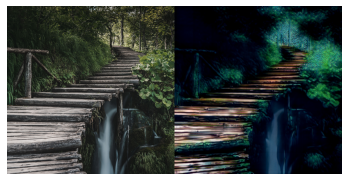

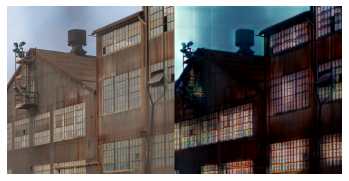

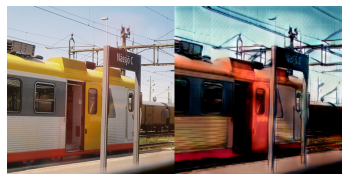

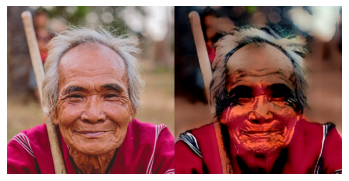

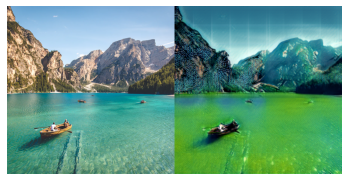

...

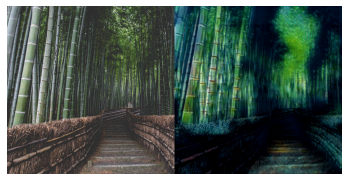

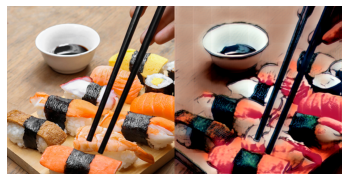

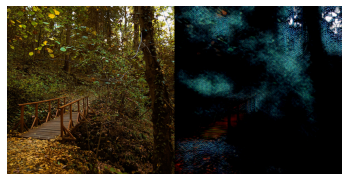

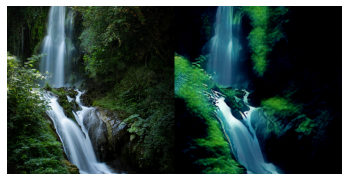

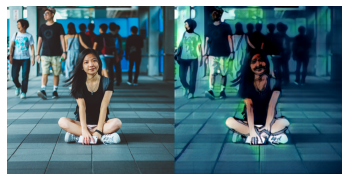

In [61]:
images = [convert_image_to_anime(x, generator=G, rescale_for_computing=1., stride_percent=.25, plot=True) for x in images_path]

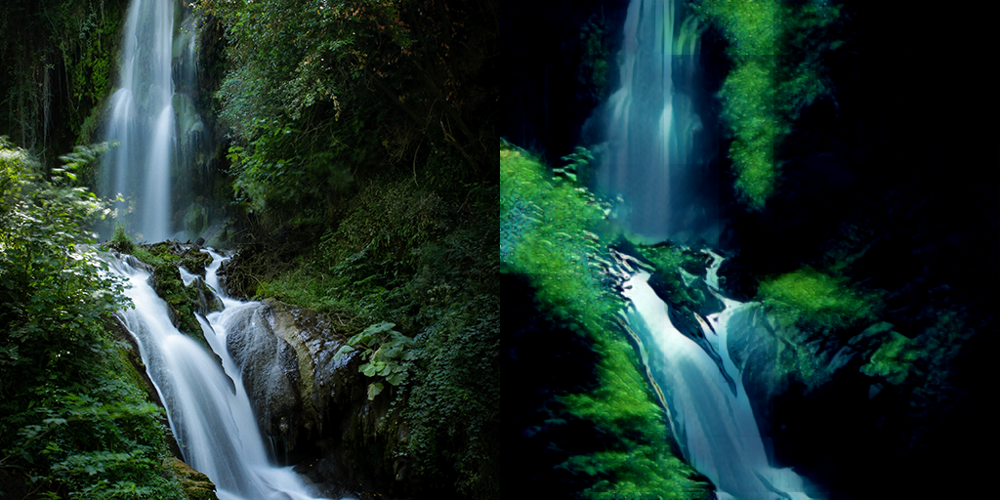

In [69]:
[Image.fromarray(i) for i in images][-2]

### Save the model

Define all the usefull function to search and save the best models from the training folder

In [63]:
def get_checkpoint_path(epoch):
  checkpoint_fnames = [os.path.join(local_checkpoint_location, 'ckpt-' + str(epoch) + '.data-00000-of-00001'),
                       os.path.join(local_checkpoint_location, 'ckpt-' + str(epoch) + '.index')]
  return checkpoint_fnames

def load_checkpoint(epoch):
  checkpoint_fname = local_checkpoint_location + 'ckpt-' + str(epoch)# + '.data-0000-of-0001'
  print("-----------Restoring from {}-----------".format(checkpoint_fname))
  checkpoint.restore(checkpoint_fname)
  return checkpoint

def load_evaluate_and_save_epoch(epoch, omega, vgg16_layer, folder, images):
  '''
    1. load the model at epcoh = 'epoch'
    2. evaluate images with the Generator loaded
    3. save model '{folder}/model_e{epoch}_o{omega}_v{vgg16_layer}/ckpt-{epoch}'
    4. save images in '{folder}/model_e{epoch}_o{omega}_v{vgg16_layer}/images/x.jpj' where x is the position of the image in the array
  '''
  # convert images to anime
  checkpoint = load_checkpoint(epoch)
  generator = checkpoint.generator
  cartoon_images = [convert_image_to_anime(image=i, generator=generator, rescale_for_computing=1., stride_percent=0.1) 
            for i in images_path]
  
  # creates folders
  if not os.path.exists(folder):
    os.mkdir(folder, )
  model_folder = os.path.join(folder, f'model_e{epoch}_o{omega}_v{vgg16_layer}')
  if not os.path.exists(model_folder):
    os.mkdir(model_folder)
  image_folder = os.path.join(model_folder, 'images')
  if not os.path.exists(image_folder):
    os.mkdir(image_folder)
  
  # save the model
  for checkpoint_f in get_checkpoint_path(epoch):
    shutil.copy(checkpoint_f, os.path.join(model_folder, os.path.basename(checkpoint_f)))

  # save the images
  for i, image in enumerate(cartoon_images):
    img = Image.fromarray(image)
    img.save(os.path.join(image_folder, f'{i}.jpg'))

  # copy history.csv
  shutil.copy(os.path.join(local_checkpoint_location, history_file_name), os.path.join(model_folder, history_file_name))

Search and save best checkpoints from training_checkpoints location.

You have to specify the value of omega used.

Models saved are the ones that have one of:
* best FID score
* best generator value loss
* last checkpoint

In [64]:
def save_best_checkpoints(omega, vgg_lvl=18, path='bests_checkpoints', min_epoch=0):
  # find available checkpoints
  available_checkpoints = [int(re.search(r'(ckpt-)([0-9]+)(.index)', x)[2]) for x in glob(f'{local_checkpoint_location}/ckpt-*.index')]
  available_checkpoints = list(filter(lambda x: x >= min_epoch, available_checkpoints))
  # load dataset from csv
  df = pd.read_csv(history_file_path, sep=',', header=0)
  df = df.set_index('epoch')
  df = df[~df.index.duplicated(keep='last')]
  df_available_checkpoints = df[[x in available_checkpoints for x in df.index]]

  # useful columns
  val_gen_loss_mean = 'val_generator_loss_mean'
  fid_score = 'fid_score'

  # search the best epochs
  df_val_gen_loss_mean = df_available_checkpoints[val_gen_loss_mean]
  best_ep_val_gen_loss = df_available_checkpoints.index[np.argmin(df_val_gen_loss_mean)]
  df_fid_score = df_available_checkpoints[fid_score]
  best_ep_fid_score = df_available_checkpoints.index[np.argmin(df_fid_score)]
  last_ep = np.max(df_available_checkpoints.index)

  best_eps = np.unique([best_ep_val_gen_loss, best_ep_fid_score, last_ep])

  for ep in best_eps:
    print(f'Saving epoch {ep}')
    load_evaluate_and_save_epoch(ep, omega, vgg_lvl, path, images_path)

In [56]:
#save_best_checkpoints(omega=0.1, vgg_lvl=18)

### Gif generation

Generate a gif for both discriminator and generator training epochs.

In [65]:
def create_gif(directory, filter='', name=None):
  if name is None:
    name = filter if len(filter) > 0 else 'gif'
  g = [
      (Image.open(os.path.join(root, name)), image_name_to_number(name))
      for root, dirs, files in os.walk(directory)
      for name in files
      if filter in name
  ]
  b = list(map(lambda x: x[0], sorted(g, key=lambda x: x[1])))
  if len(b) > 0:
    b[0].save(
        f"{filter}.gif",
        save_all=True,
        append_images=b[1:],
        optimize=False,
        duration=600,
        loop=0,
    )
  else:
    print('Training images are absent. Skipping GIF generation.')

create_gif(image_directory, 'generator')
create_gif(image_directory, 'discriminator')

Training images are absent. Skipping GIF generation.
Training images are absent. Skipping GIF generation.


In [66]:
if path.isfile('generator.gif'):
  ImageGif(open('generator.gif','rb').read())

In [67]:
if path.isfile('discriminator.gif'):
  ImageGif(open('discriminator.gif','rb').read())

# Error analysis
<!-- TODO: parlare delle prestazioni -->


# Development process retrospective

## Challenges and objectives

## Problems encountered

### omega parameter misunderstanding in ContentLoss

We analyse now the value of omega into the loss, for semplicity we repeat here the used loss function (for more details see [Loss Function](https://colab.research.google.com/drive/1f9BxFxPxhPKUba8Ifcq4juv042ZA484-#scrollTo=IBKihPPW_WkZ) section of this notebook).
\begin{align}
𝐿(𝙶, 𝙳) = 𝐿_{adv}(𝙶, 𝙳) + ω 𝐿_{con}(𝙶, 𝙳)
\end{align}
The adversarial loss can be seen as a measure of how well the combined networks can transfer the cartoon style to the target image whereas the content loss can be seen as a measure of how well the content structure of the source image is preserved.

As first instance we used the omega value suggest by the paper of CartooGan that is `ω = 10`.
This value has proved, in our experience, to be too high.

In fact, with this omega value we have that

\begin{align}
ω 𝐿_{con}(𝙶, 𝙳) >> 𝐿_{adv}(𝙶, 𝙳)
\end{align}

this create instability in generator training making useless the discriminator loss and creating a bringing the generator in a local minima where only the content loss is considered.

## Future work
